In [113]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import cv2
import os
import glob
from lxml import etree
from sklearn.model_selection import train_test_split

In [137]:
IMAGE_SIZE = 200

img_dir = "./dataset/images"
data_path = os.path.join(img_dir,'*g')
files = glob.glob(data_path)
files.sort() 
X=[]
for f1 in files:
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))

In [138]:
def resizeannotation(f):
    tree = etree.parse(f)
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = float(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = float(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = float(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = float(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]

In [139]:
path = './dataset/annotations'
text_files = ['./dataset/annotations/'+f for f in sorted(os.listdir(path))]
y=[]
for i in text_files:
    y.append(resizeannotation(i))


In [140]:
print(np.array(X).shape)
print(np.array(y).shape)

(80, 200, 200, 3)
(80, 4)


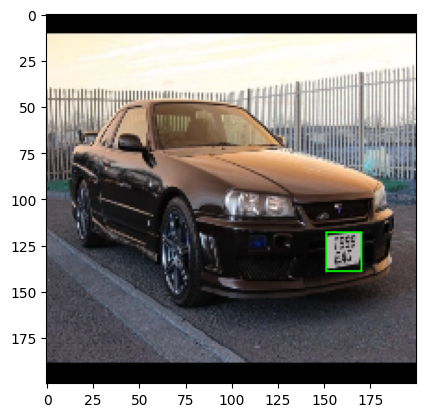

In [118]:
image = cv2.rectangle(X[0],(y[0][0],y[0][1]),(y[0][2],y[0][3]),(0, 255, 0))
plt.imshow(image)
plt.show()

In [141]:
#Transforming in array
X=np.array(X)
y=np.array(y)

#Renormalisation
X = X / 255
y = y / 255

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

In [120]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.vgg16 import VGG16

# Create the model
model = Sequential()
model.add(VGG16(weights="imagenet", include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 18432)             0         
                                                                 
 dense_16 (Dense)            (None, 128)               2359424   
                                                                 
 dense_17 (Dense)            (None, 128)               16512     
                                                                 
 dense_18 (Dense)            (None, 64)                8256      
                                                                 
 dense_19 (Dense)            (None, 4)                 260       
                                                                 
Total params: 17,099,140
Trainable params: 2,384,452
N

In [121]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
train = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=12, verbose=1)

Epoch 1/50
6/6 [==============================] - 8s 1s/step - loss: 0.0366 - accuracy: 0.3889 - val_loss: 0.0625 - val_accuracy: 0.0000e+00
Epoch 2/50
6/6 [==============================] - 7s 1s/step - loss: 0.0231 - accuracy: 0.5000 - val_loss: 0.0194 - val_accuracy: 0.5000
Epoch 3/50
6/6 [==============================] - 7s 1s/step - loss: 0.0118 - accuracy: 0.5417 - val_loss: 0.0177 - val_accuracy: 0.6250
Epoch 4/50
6/6 [==============================] - 7s 1s/step - loss: 0.0059 - accuracy: 0.7500 - val_loss: 0.0133 - val_accuracy: 0.7500
Epoch 5/50
6/6 [==============================] - 7s 1s/step - loss: 0.0040 - accuracy: 0.6667 - val_loss: 0.0121 - val_accuracy: 0.7500
Epoch 6/50
6/6 [==============================] - 7s 1s/step - loss: 0.0032 - accuracy: 0.6944 - val_loss: 0.0146 - val_accuracy: 0.6250
Epoch 7/50
6/6 [==============================] - 7s 1s/step - loss: 0.0025 - accuracy: 0.8889 - val_loss: 0.0119 - val_accuracy: 0.7500
Epoch 8/50
6/6 [=====================

In [122]:
# Test
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

model.save('models/model_lp.h5')

Score : 75.00%


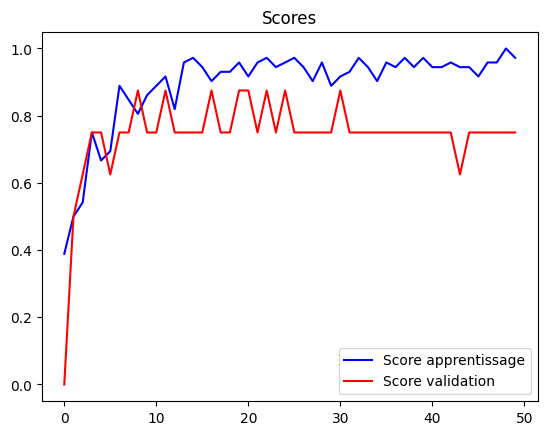

In [123]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score apprentissage')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()
plot_scores(train)

In [124]:
y_cnn = model.predict(X_train)
y_cnn.shape

3/3 [==============================] - 6s 2s/step


(72, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

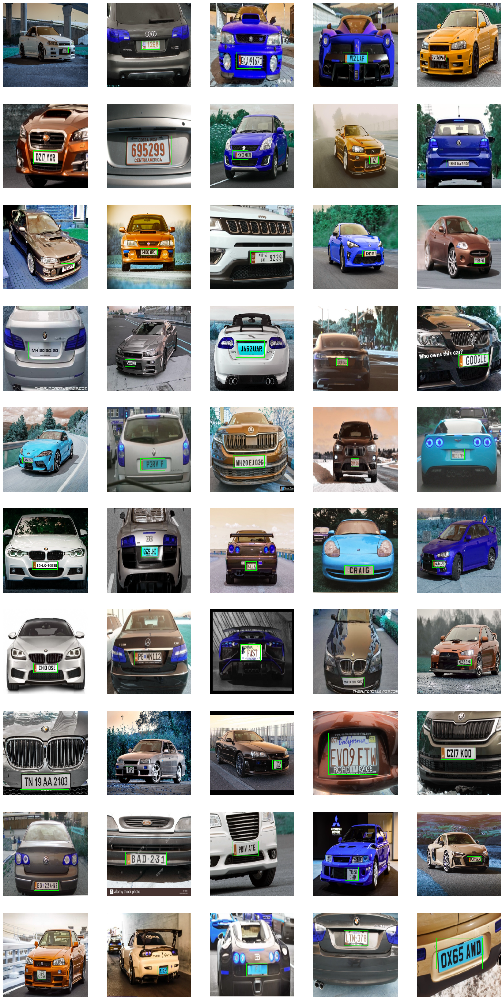

In [125]:
plt.figure(figsize=(20,40))
for i in range(0,50) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_train[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

In [133]:
from tensorflow import keras
from keras.applications import InceptionResNetV2
from keras.layers import Dense, Dropout, Flatten, Input
from keras.models import Model
import tensorflow as tf
from keras.callbacks import TensorBoard

In [135]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(200,200,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

In [136]:
# Complie model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_203 (Conv2D)            (None, 99, 99, 32)   864         ['input_8[0][0]']                
                                                                                                  
 batch_normalization_203 (Batch  (None, 99, 99, 32)  96          ['conv2d_203[0][0]']             
 Normalization)                                                                                   
                                                                                            

In [143]:
tfb = TensorBoard('object_detection')
history = model.fit(x=X_train,y=y_train,batch_size=10,epochs=20,
                    validation_data=(X_test,y_test),callbacks=[tfb])

Epoch 1/20
8/8 [==============================] - 27s 3s/step - loss: 0.0040 - val_loss: 0.0898
Epoch 2/20
8/8 [==============================] - 26s 3s/step - loss: 0.0038 - val_loss: 0.0617
Epoch 3/20
8/8 [==============================] - 26s 3s/step - loss: 0.0034 - val_loss: 0.0774
Epoch 4/20
8/8 [==============================] - 26s 3s/step - loss: 0.0026 - val_loss: 0.0635
Epoch 5/20
8/8 [==============================] - 27s 3s/step - loss: 0.0031 - val_loss: 0.0573
Epoch 6/20
8/8 [==============================] - 26s 3s/step - loss: 0.0040 - val_loss: 0.0507
Epoch 7/20
8/8 [==============================] - 26s 3s/step - loss: 0.0027 - val_loss: 0.0452
Epoch 8/20
8/8 [==============================] - 26s 3s/step - loss: 0.0024 - val_loss: 0.0446
Epoch 9/20
8/8 [==============================] - 27s 3s/step - loss: 0.0020 - val_loss: 0.0432
Epoch 10/20
8/8 [==============================] - 27s 3s/step - loss: 0.0023 - val_loss: 0.0622
Epoch 11/20
8/8 [======================

In [145]:
scores = model.evaluate(X_test, y_test, verbose=0)
# print("Score : %.2f%%" % (scores[1]*100))

model.save('models/model_lpv2.h5')

In [147]:
y_cnn = model.predict(X_train)
y_cnn.shape

3/3 [==============================] - 9s 2s/step


(72, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

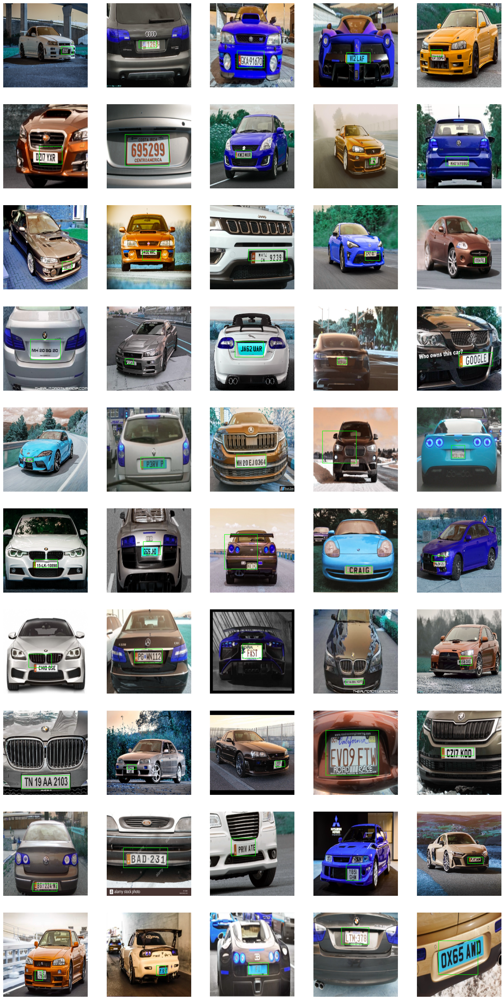

In [148]:
plt.figure(figsize=(20,40))
for i in range(0,50) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_train[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)